# Environmental Data and Gaussian Processes

In [1]:
import numpy as np
import pandas as pd
import zipfile

arys = []
with zipfile.ZipFile("GP_homework_data.zip") as zipf:
  for i in range(1, 101):
    h = pd.read_csv(zipf.open("OceanFlow/{}u.csv".format(i)), header=None).to_numpy().T
    v = pd.read_csv(zipf.open("OceanFlow/{}v.csv".format(i)), header=None).to_numpy().T
    arys.append(np.transpose(np.array([h, v], dtype=np.float32), [1, 2, 0]))
  mask = pd.read_csv(zipf.open("OceanFlow/mask.csv".format(i)), header=None).to_numpy().T[:,::-1]
data = np.array(arys)

### Problem 1 (a)

In [2]:
def argmin_nd(a):
  return np.unravel_index(np.argmin(a, axis=None), a.shape)

def argmax_nd(a):
  return np.unravel_index(np.argmax(a, axis=None), a.shape)

mag_variance = np.sqrt(np.square(data).sum(axis=3)).var(axis=0, ddof=0)
mag_variance[mag_variance == 0] = np.inf
np.array(argmin_nd(mag_variance))*3

array([510, 363])

### Problem 1 (b)

In [3]:
np.array(argmax_nd(data[:,:,:,0]))*3

array([  84, 1041,  543])

### Problem 1 (c)

In [4]:
data.mean(axis=(0, 1, 2))

array([-0.09359308, -0.03547521], dtype=float32)

### Problem 2

We will find the correlations by:
1. Sampling `num_pairs` pairs of random locations on the map.
2. Removing all pairs for which the distance of the pairs is less than the distance threshold, `dist_threshold`.
3. Finding the velocity arrays for each location, and taking the element-wise product between them. Then taking the mean over time. The effectively finds the second moment of the distribution. We will look at this first, then by providing the `delta` parameter we will look at the covariances.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


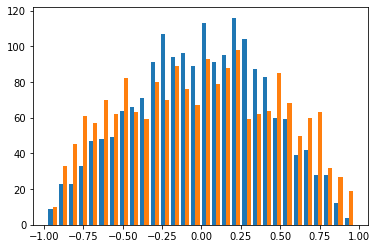

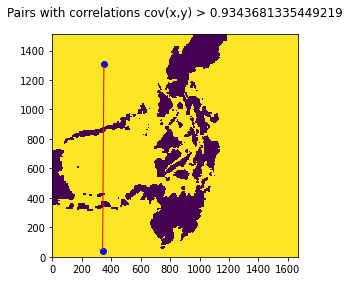

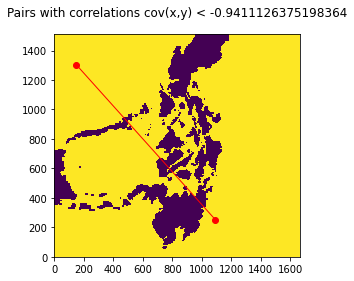

In [5]:
def get_correlated_pairs(d, num_pairs, dist_threshold, mag_threshold=None):
  pairs = np.array([ np.random.randint(0, data.shape[1], size=[2, num_pairs]), np.random.randint(0, data.shape[2], size=[2, num_pairs]) ]).transpose([2, 1, 0])
  idx_dist_threshold = dist_threshold/3.0
  pairs_dists = np.sqrt(np.square(pairs[:,0,:] - pairs[:, 1, :]).sum(axis=1))
  ps = pairs[pairs_dists > idx_dist_threshold, :, :]
  
  moment = lambda a: np.sqrt(np.square(a).mean(axis=0))
  if mag_threshold:
    ps = ps[(moment(d[:,ps[:,0,0],ps[:,0,1]]) * moment(d[:,ps[:,1,0],ps[:,1,1]])).min(axis=1) > mag_threshold]
  d_delta = (d - d.mean(axis=0)[None, :, :, :])
  div = ( moment(d_delta[:,ps[:,0,0],ps[:,0,1]]) * moment(d_delta[:,ps[:,1,0],ps[:,1,1]]) )
  corrs = (d_delta[:,ps[:,0,0],ps[:,0,1]]*d_delta[:,ps[:,1,0],ps[:,1,1]]).mean(axis=0)/div
  return ps[div.min(axis=1)>0], corrs[div.min(axis=1)>0]
  
  

import matplotlib.pyplot as plt
import matplotlib
plt.hist(get_correlated_pairs(data, 50000, 1500.0)[1], bins=30)
plt.show()

def plot_correlated_pairs(pairs, covs, cov_threshold, negative=False):
  covs, cov_cut = (-covs, -cov_threshold) if negative else (covs, cov_threshold)
  plot_pairs = pairs[np.all(covs >= cov_cut, axis=1)]

  x_extent, y_extent = 3*(data.shape[1]+1), 3*(data.shape[2]+1)
  plt.matshow(mask.T, origin='lower', extent=[0, x_extent, 0, y_extent])
  plt.axis([0, x_extent, 0, y_extent])
  plt.title("Pairs with correlations cov(x,y) {} {}".format("<" if negative else ">", cov_threshold))

  cmap = plt.get_cmap('hsv')
  lc = matplotlib.collections.LineCollection(plot_pairs*3, colors=cmap(np.linspace(0, 1, plot_pairs.shape[0]+1))[:-1], linewidths=1)
  plt.gca().add_collection(lc)
  plt.scatter(*plot_pairs.reshape((-1, 2)).T*3, c='r' if negative else 'b', marker='o')
  plt.gca().xaxis.tick_bottom()
  plt.show()

p2_pairs, p2_corrs = get_correlated_pairs(data, 1000000, 1000.0)
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.min(axis=1).max(axis=0))
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.max(axis=1).min(axis=0), negative=True)



The main driving forces of curface coean currents are wind, Coriolis forces, and the land. We can expect some correlation between locations due to prevailing wind (note for example that the velocities in the east are generally in the same direction). Coriolis forces tend to act over much larger distances, and the direction of the force depends on the velocity of the current, so it is not a factor that should be relevant here. We should also expect the land to influence the direction, if not the magnitude of the currents.

At first glance, there doesn't seem to be much in common between the points with positive correlation. It turns out that these locations have very close to zero velocity, as they are near or at vortices in the ocean currents. This causes them to be highly influenced by the prevailing winds, thus causing a common correlation between them. However, this is not particularly interesting.

Now we will look at the correlations with a threshold on the size of the velocity.

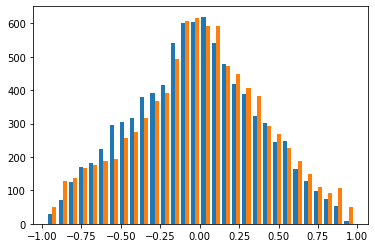

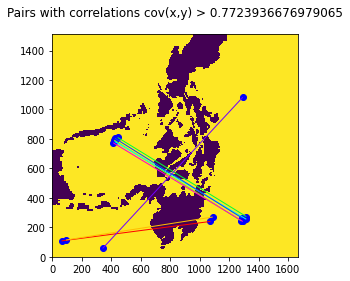

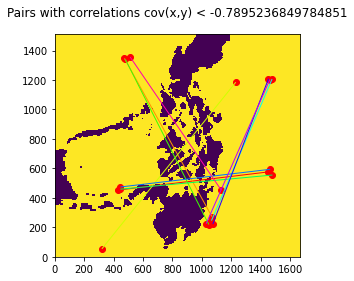

In [6]:
p2_pairs, p2_corrs = get_correlated_pairs(data, 2000000, 1000.0, mag_threshold=0.3)
plt.hist(p2_corrs, bins=30)
plt.show()
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.min(axis=1).max(axis=0)-0.1)
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.max(axis=1).min(axis=0)+0.1, negative=True)

Now, note that the currents for essentially all of the postively correlated pairs are traveling west. It seems that again, the correlating factor is the prevailing winds driving the currents west. We should be careful to note that true west on this plot actually corresponds to south-west on the globe. So the prevailing winds would actually be traveling north-west on the map. Despite this, the correlations seem to be for map-west traveling currents.

For many of these points on the west side of the map, we can note that their direction is highly influenced by the nearby land. The curents on the east of the map have yet to run into land, but they will still be influenced by the pressure building up ahead of them as the currents run into the land. So the land also seems to be an important factor to account for here, though less important than the winds.

### Problem 3 (a)

In [7]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

def flowplot(ax, grid_x, grid_y, title, overlay=None, grid_stride=1, density=False):
  sc_cmap = plt.get_cmap('cool')
  sc = ax.scatter(0, 0, marker='o')
  ax.set_xlabel(r"$x$-axis")
  ax.set_ylabel(r"$y$-axis")
  ax.set_title(title)
  qv = ax.quiver(grid_x[::grid_stride,::grid_stride], grid_y[::grid_stride,::grid_stride], 
                 np.ones_like(grid_x[::grid_stride,::grid_stride]), np.ones_like(grid_y[::grid_stride,::grid_stride]))
  if overlay:
    overlay(ax)
  def update(new_loc, new_fl = None, new_title=None):
    sc.set_offsets(new_loc)
    if density:
      from scipy.stats import gaussian_kde
      estimate_points = new_loc[np.all([new_loc[:,0]>grid_x[3,0], 
                                        new_loc[:,0]<grid_x[-3,0],
                                        new_loc[:,1]>grid_y[0,3], 
                                        new_loc[:,1]<grid_y[0,-3]], axis=0) ]
      cs = gaussian_kde(estimate_points.T)(new_loc.T)
      sc.set_facecolors(sc_cmap((cs-cs.min())/cs.max()))
    if new_title:
      ax.set_title(new_title)
    if new_fl:
      qv.set_UVC(new_fl[0][::grid_stride,::grid_stride], new_fl[1][::grid_stride,::grid_stride])
      return sc, qv
    else:
      return sc,
  return update

import matplotlib.animation as anim

def animate(state, g_x, g_y, title, overlay=None, grid_stride=1, density=False):
  fig, ax = plt.subplots()
  update_plot = flowplot(ax, 
                         g_x, g_y, 
                         title.format(0),
                         overlay,
                         grid_stride,
                         density)

  def frame(s):
    x, t, v, fl_x, fl_y = s
    return update_plot(x,
                      new_fl = (fl_x, fl_y), 
                      new_title=title.format(t))

  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)
  plt.close()
  return animation

from jax.config import config
config.update("jax_enable_x64", True)
import jax.numpy as jnp
import jax
import functools

@functools.partial(jax.jit, static_argnums=(0,1))
def jax_sim(N, save_stride, t_edges, g_x_edges, g_y_edges, v_grid, x_0, epsilon):

  clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))

  def get_grid(t):
    vt = clamp(jnp.searchsorted(t_edges, t), 1, t_edges.shape[0]-1)
    return v_grid[vt-1]

  def get_v(grid, x):
    vi = clamp(jnp.searchsorted(g_x_edges, x[:,0]), 1, g_x_edges.shape[0]-1)
    vj = clamp(jnp.searchsorted(g_y_edges, x[:,1]), 1, g_y_edges.shape[0]-1)
    return grid[vi-1,vj-1,:]

  state_0 = (x_0, 0.0, get_v(get_grid(0.0), x_0), *get_grid(0.0).transpose([2,0,1]))
  
  def step(i, state):
    x, t, v, _, _ = state

    v_t_grid = get_grid(t)
    v = get_v(v_t_grid, x)
    
    x = x + epsilon*v # Compute the next position value
    t = t + epsilon # Compute the next time
    
    new_state = (x, t, v, v_t_grid[:,:,0], v_t_grid[:,:,1])
    return new_state

  def save_step(state, i):
    new_state = jax.lax.fori_loop(i, i+save_stride, step, state)
    return new_state, new_state
  
  _, states = jax.lax.scan(save_step, state_0, xs=jnp.arange(0, N, save_stride))
  return states

The simulation algorithm is first initialized in the state $s_0$, which contains the initial position of each particle to be simulated, and the current time step of the simulation:
\begin{equation}
  s_0 = (x_0, t_0).
\end{equation}

For each step of the simulation, the flow velocity is found by first digitizing the current time step, $t_i$, of the simulation into an index for the data array of velocities. This digitization is performed through a binary search into an array of time stamps that mark the boundaries between data points in the data array. Note that if these boundaries are regular (like they are for this homework), we could have also divided by the time delta between data points and rounded to an integer to find the index.

The particle locations, $x_i$, are then digitized in the same way, using arrays of locations that mark the boundaries between data points. With these three indicies, the appropriate velocity vector is retreived from the data array.

The current location of each particle is then advanced by one time step:
\begin{equation}
  x_{i+1} \leftarrow x_i + \epsilon v_{i+1},
\end{equation}
where $v_i$ is the velocity at step $i$ as detailed above, $x_{i+1}$ and $x_i$ are the next and current locations of the particles, and $\epsilon$ is the time delta between simulation steps.

The current time step of the simulation is also advanced by $\epsilon$:
\begin{equation}
  t_{i+1} \leftarrow t_i + \epsilon.
\end{equation}

The state of the simulation is then saved as
\begin{equation}
  s_{i+1} = (x_{i+1}, t_{i+1}).
\end{equation}

Note that in the Python implementation of this algorithm, the current velocity for each particle and the current velocity map are also saved into the state of the simulation.
These are not needed for the simulation, but are used for visualizing the results.




In [8]:
T = 300.0 #@param {type:"number"}
N = 200000 #@param {type:"integer"}
num = 1000 #@param {type:"integer"}
epsilon = T/N # hours

#x_0 = np.array([[1300.0, 800.0]])

midpoint = lambda ar: (ar[1:] + ar[:-1])/2

grid_t_edges = np.arange(0, data.shape[0]+1)*3 # 3hrs per point
grid_x_edges = np.arange(0, data.shape[1]+1)*3 # 3km per point
grid_y_edges = np.arange(0, data.shape[2]+1)*3 # 3km per point
grid_x, grid_y = np.meshgrid(midpoint(grid_x_edges), midpoint(grid_y_edges), indexing='ij')

x_0 = np.array([ np.random.rand(num)*grid_x_edges.max(), np.random.rand(num)*grid_y_edges.max() ]).T

def plot_overlay(ax):
  ax.matshow(mask.T, origin='lower', extent=[0, grid_x_edges.max(), 0, grid_y_edges.max()])
  ax.axis([0, grid_x_edges.max(), 0, grid_y_edges.max()])

states = jax_sim(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon)

In lieu of four plots, the following the animation is provided, from which the required four plots can be easily taken but will be omitted here.

In [9]:
animation = animate(zip(*states), grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20)
import IPython.display
from IPython.display import HTML
HTML(animation.to_html5_video())

### Problem 3 (b)

In [10]:
for x_0_variance in [10**2, 30**2, 50**2]:
  x_0 = np.random.multivariate_normal(mean=[300, 1050], cov=[[x_0_variance, 0], [0, x_0_variance]], size=num)

  plane_states = jax_sim(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon)
  plane_animation = animate(zip(*plane_states), grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
  IPython.display.display(HTML(plane_animation.to_html5_video()))

From the first animation, with $\sigma^2=10^2$, we see that the core probability does not move very far, as we should not look much further afield than the supposed crash location.

From the last animation, with $\sigma^2=50^2$, we see that the tails of the unceratinty distribution are squashed into somewhat of a line, creating an asymmetric shape. We should use this to plan the direction of a search by plane. The plane can search along this wide direction of the distribution, making sure to fly over the location of highest probability noted above.

The path is marked on the plot below:

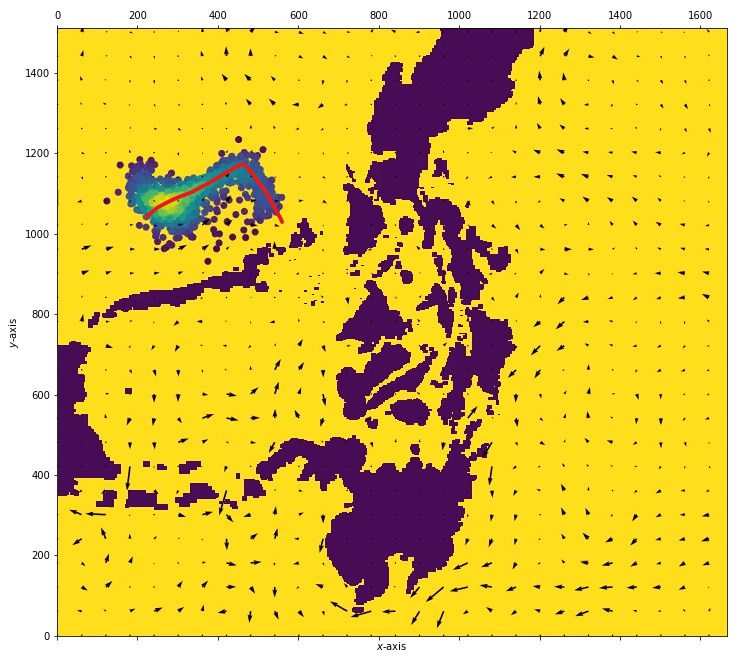

### Problem 4 (a)

Here, we will use the following choice of kernel function:
\begin{equation}
  K(z_i,z_j) = a^2 \exp{(-(z_i-z_j)^2/l^2)},
\end{equation}
as these are the official solutions and this was the suggested kernel in the homework.

Another choice we could have made would be an exponential kernel function:
\begin{equation}
  K(z_i,z_j) = a^2 \exp{(-\|z_i-z_j\|/l)}.
\end{equation}
Exponential correlations are common in natural systems when there is a degree of `locality', meaning there is no long-range forces that can cause the velocity at hour $t=0$ to directly influence the velocity at hour $t=120$, for example.
At a more practical level, this kernel function is steeper around $\|z_i-z_j\|\approx 0$, while the gaussian kernel above is approximately flat.
This reduces the amount of correlation in the covariance matrix which can made the inversion routines more stable.

On the other hand, if we do expect some form of long range correlations (seasonality, or some other effect, for example), then a periodic or power-law type kernel may give more accurate results.


In [11]:
import scipy

def gaussian_process(x0_mean, x1_mean, x1, cov_blocks, tau):
  cov_11_noise = cov_blocks[1][1] + tau * np.eye(x1_mean.shape[0])

  x0_mean_cond1 = x0_mean + cov_blocks[0][1].dot( np.linalg.solve(cov_11_noise, x1 - x1_mean ) )
  cov_00_cond2 = cov_blocks[0][0] - cov_blocks[0][1].dot(np.linalg.solve(cov_11_noise, cov_blocks[0][1].T))

  return x0_mean_cond1, cov_00_cond2

def cross_validate(K, values, means, cov, tau):
  perm = np.random.permutation(values.shape[0])
  folds = list(map(np.sort, np.array_split(perm, K)))

  def validate(i):
    test = folds[i]
    train = np.array(sorted(list(set(perm) - set(test))))

    cov_blocks = [
                  [ cov[test[:,None],  test], cov[test[:,None],  train] ],
                  [ cov[train[:,None], test], cov[train[:,None], train] ]
    ]

    x0_mean_cond1, cov_00_cond2 = gaussian_process(means[test], means[train], values[train], cov_blocks, tau)
    
    try:
      return scipy.stats.multivariate_normal.logpdf(values[test], mean=x0_mean_cond1, cov=cov_00_cond2+1E-10 * np.eye(cov_00_cond2.shape[0]))
    except:
      # Some diagnostics in case of problems
      print(np.linalg.eigvals(cov_00_cond2))
      print(np.linalg.eigvals(cov_00_cond2+1E-7 * np.eye(cov_00_cond2.shape[0])))
      print((cov_00_cond2-cov_00_cond2.T).max()/cov_00_cond2.max())
      raise

  return np.mean(list(map(validate, range(K))))

def generate_cov(zs1, zs2, a, ell):
  return (a**2) * np.exp(-(zs1[:,None] - zs2[None, :])**2 / ell**2)

def scan_seq(zs, a_scan, ell_scan):
  for a in a_scan:
    for ell in ell_scan:
      yield (a, ell), generate_cov(zs, zs, a, ell)

def scan(K, values, means, tau, cov_seq):
  best = -np.inf
  best_coords = None
  grid = []
  for coords, cov in cov_seq:
    metric = cross_validate(K, values, means, cov, tau)
    if metric > best:
      best = metric
      best_coords = coords
    grid.append(list(coords) + [metric])
  grids = np.array(grid).T
  return best_coords, grids

In [12]:
grid_longT_edges = np.arange(0, data.shape[0]+1)*(3*24) # 3 days per point

From the selected kernel function,
\begin{equation}
  K(z_i,z_j) = a^2 \exp{(-(z_i-z_j)^2/l^2)},
\end{equation}
we have the parameters $a$ and $l$. Thus the parameter vector is $\theta=\{a,l\}$.

For $l$, we will scan over the range of $7.5$ hours to $375$ hours with $100$ linearly spaced points. Recall that each data point is now considered to have a $3$ day, or $72$ hour separation. So this range covers both very short time-scales, less than a day, to multiple day time-scales.

For $a$, we will compute the second moment of the velocity data, and use that as a baseline for the scan. We will then scan in range of $0.1$ times this moment, to $10$ times this moment, with $100$ points linearly spaced. This way, we tend to keep the amount of correlation on the same scale as the absolute magnitude of the data.

We will use $k=10$ folds for the cross-validation. This is fairly high amount, but in my testing, I found it gave more stable results. Reducing $k$, especially to around $5$, tended to cause the covariance matrix to become singular, as the larger number of testing points were, on average, closer to each other which resulted in very high, and thus difficult to invert, correlations.

In [13]:
def scan_position(loc, tau):
  a_scan = np.linspace(0.1, 10.0, 100)
  ell_scan = 75*np.linspace(0.1, 5.0, 100)
  for values in [ data[:, loc[0], loc[1], 0], data[:, loc[0], loc[1], 1] ]:
    values = values[::1]
    z_locations = grid_longT_edges[:-1:1]
    val_std = np.sqrt(np.square(values).mean())
    #values = (values-values.mean())/values.std()
    #val_std = values.std()
    #print()
    result, result_grids = scan(10, values, np.zeros_like(values), tau, scan_seq(z_locations, val_std*a_scan, ell_scan))
    yield result, result_grids

# We'll calculate all four points we'll need for parts (a) and (b) here.
p4_scan_products = list(map(lambda p: list(scan_position(p, 0.001)), [
            [1400//3, 400//3],
            [400//3, 600//3],
            [500//3, 1400//3],
            [1200//3, 1200//3]
]))


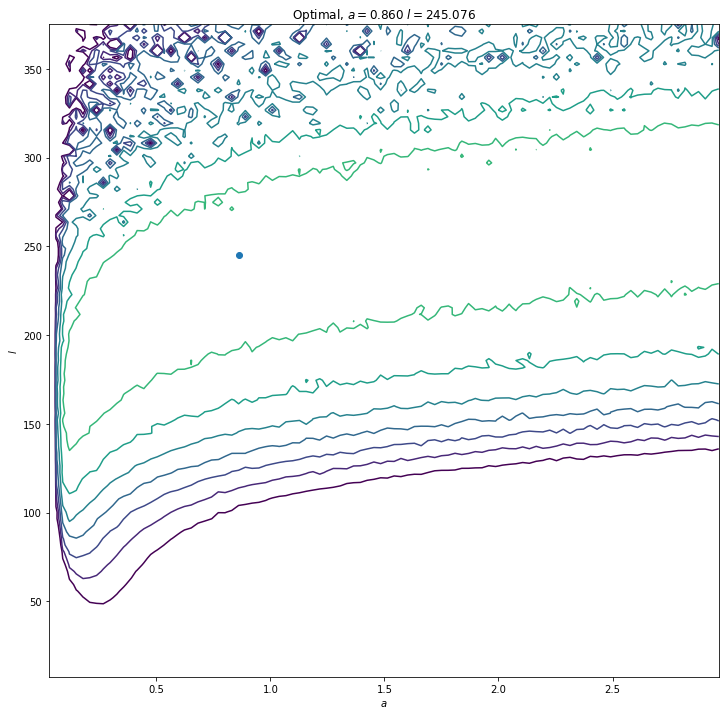

In [15]:
def plot_scan_results(products, level_range=(0, 30)):
  best, grids = products
  x_grid, y_grid, z_grid = map(lambda a: a.reshape((100, 100)), grids)

  plt.contour(x_grid, y_grid, z_grid, levels=np.linspace(level_range[0], level_range[1], 10))
  plt.scatter(*best, marker='o')
  plt.title(r"Optimal, $a={:.3f}$ $l={:.3f}$".format(*best))
  plt.xlabel(r"$a$")
  plt.ylabel(r"$l$")

plot_scan_results(p4_scan_products[0][0])

### Problem 4 (b)

Here we'll plot all four of the points that we evaluated earlier, for easier comparison.

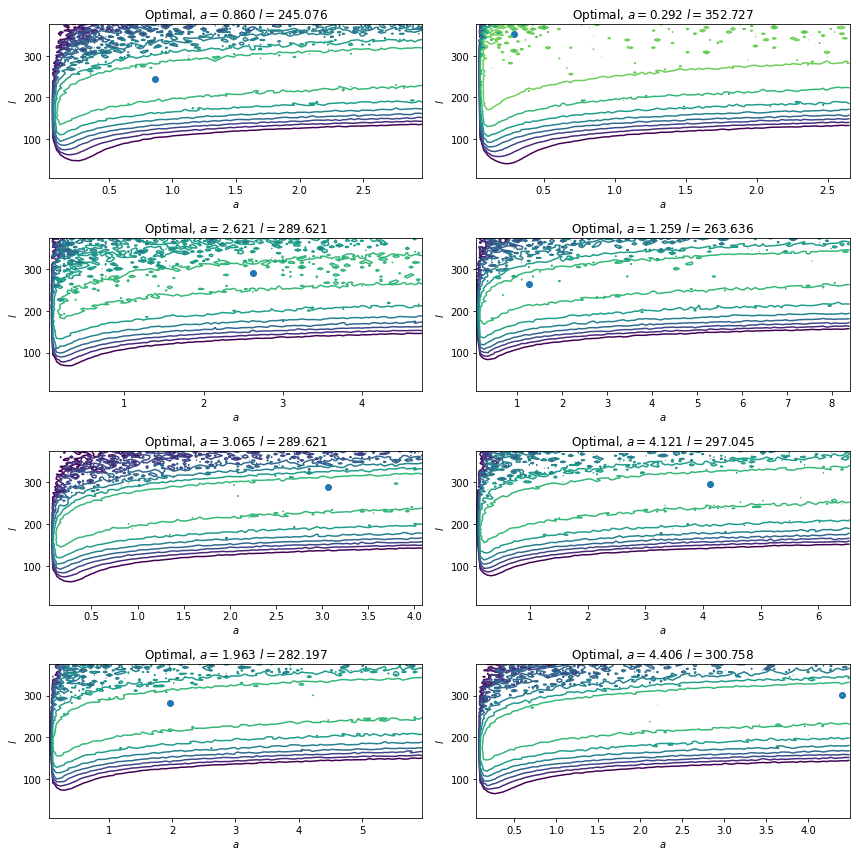

In [16]:
for i, pos_results in enumerate(p4_scan_products):
  for j, comp_results in enumerate(pos_results):
    plt.subplot(len(p4_scan_products), 2, 1 + 2*i + j)
    plot_scan_results(comp_results)
    
plt.tight_layout()

We can see that $a$ tends to be between $2$ and $3$ for most of these scans, though sometimes it is a little lower.

For $l$, it appears to generally be around $280 \pm 10$. Although the first point we tried had very different optimal values of $l$ for the $x$ and $y$ components of the velocity. 

### Problem 4 (c)

In [17]:
p4_c_scan_products = list(map(lambda tau: list(scan_position([1200//3, 1200//3], tau)), [
            0.001, 0.01, 0.1
]))

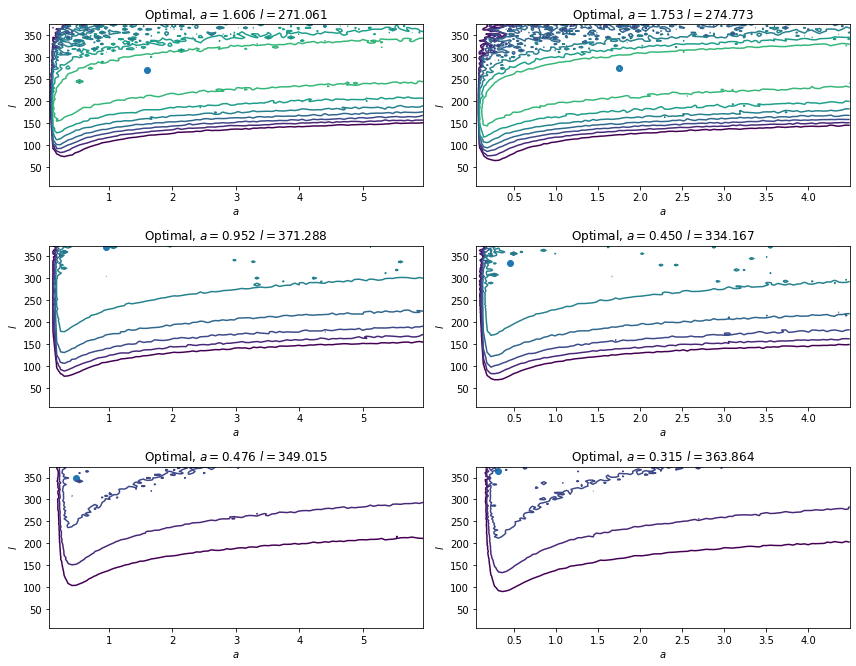

In [18]:
for i, pos_results in enumerate(p4_c_scan_products):
  for j, comp_results in enumerate(pos_results):
    plt.subplot(len(p4_scan_products), 2, 1 + 2*i + j)
    plot_scan_results(comp_results)
    
plt.tight_layout()

The top row is our original choice of $\tau=0.001$. We can see that increasing $\tau$ causes the correlation time-scale, $l$, to increase until it reaches the edge space, while the original choice of $\tau$ was comfortably within the search space. Both of the new choices, $\tau=0.01,0.1$, are close enough to the edge can we can say the results of both are the same up to the size of the search space we have chosen.

Ancedotally, for $\tau=0.1$, when I tried increasing the search space I couldn't find a local maximum. Thus, our original choice of $\tau=0.001$ is the best behaving of all of these.

### Problem 4 (d)

Here we will use the Gaussian Process algorithms in the `scikit-learn` Python library. The API takes a kernel that is built using kernel objects that also defined by the API. The values specified for the parameters of this kernel are the starting locations for the search that the algorithm will perform.

The `ConstantKernel` provides the value of $a^2$, while the `RBF` is a exponential of the squared distance between the points.
The algorithm also takes a value, called `alpha`, that it adds to the diagonal of the covariance matrix. The documentation states that this can be used to simulate measurement error, so this is a good place to put the $\tau$ parameter.

When we call the `fit` method, the algorithm performs a search in parameter space for the best kernel parameters, which we can then access through the `.kernel_` field. Note that the algorithm treats all parameter values as being in log-space, so we need to exponentiate the results.

We can then scan over the values of $a$ and $l$ and call the `log_marginal_likelihood` to get the optimization target. Note that we have to take the log of the parameters as the algorithms treats all parameters as being in log-space.

We can also call the `predict` method, which computes predictions for the given locations.

In [19]:
def scikit_scan_position(loc, tau):
  a_scan = np.linspace(0.1, 10.0, 100)
  ell_scan = 75*np.linspace(0.1, 5.0, 100)
  for values in [ data[:, loc[0], loc[1], 0], data[:, loc[0], loc[1], 1] ]:
    values = values[::1]
    z_locations = grid_longT_edges[:-1:1]
    val_std = np.sqrt(np.square(values).mean())
    
    import sklearn.gaussian_process

    GPR = sklearn.gaussian_process.GaussianProcessRegressor(
        kernel = sklearn.gaussian_process.kernels.ConstantKernel(constant_value=val_std, constant_value_bounds=(val_std*0.1, val_std*10.0)) * sklearn.gaussian_process.kernels.RBF(length_scale=100.0, length_scale_bounds=(7.5, 375)), 
        alpha = tau # this is basically tau
        ).fit(z_locations.reshape(-1, 1), values)

    result = np.exp(GPR.kernel_.theta)

    grid = []
    for a in a_scan:
      for ell in ell_scan:
        grid.append([a, ell, GPR.log_marginal_likelihood(np.log([a, ell]))])
    result_grids = np.array(grid).T

    #result, result_grids = scan(10, values, np.zeros_like(values), tau, scan_seq(z_locations, val_std*a_scan, ell_scan))
    yield result, result_grids

p4_d_scan_products = list(map(lambda p: list(scikit_scan_position(p, 0.001)), [
            [1400//3, 400//3],
            [400//3, 600//3],
            [500//3, 1400//3],
            [1200//3, 1200//3]
]))

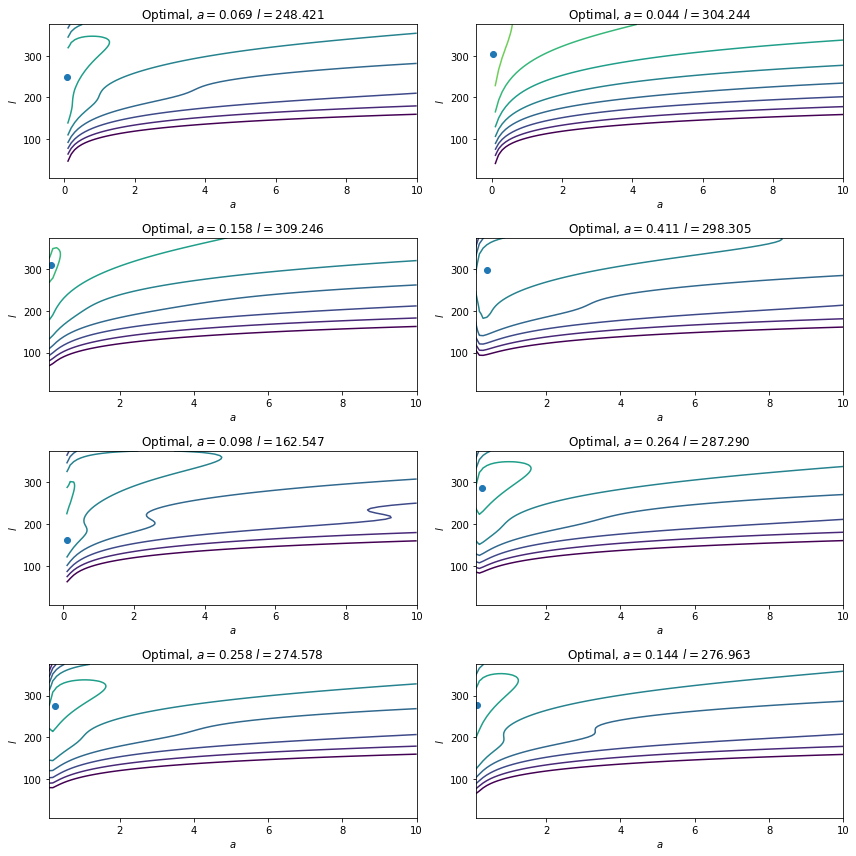

In [20]:
for i, pos_results in enumerate(p4_d_scan_products):
  for j, comp_results in enumerate(pos_results):
    plt.subplot(len(p4_d_scan_products), 2, 1 + 2*i + j)
    plot_scan_results(comp_results, level_range=(0, 200))
    
plt.tight_layout()

See Problem 5 for a direct comparison of predictions for our implementation of GP and the scikit implementation.

From the above scans, we see that scikit generally produces the same length scale, $l$, but a much smaller value of $a$.

When we compare the predictions, we can note two major differences:
- Our GP tends to produce predictions that are closer to the observations, interpolating them better, while the scikit solution is a bit smoother.
- Our GP creates a very wide $\sigma$ band at the edge of the dataset, while the scikit implementation does not. If we adjust the $a$ for our GP to be similar to the scikit optimal of $\approx 0.1$ we find that this wide band disappears.

It seems that during our cross-validation, we don't end up testing the very edge of the dataset, and so it's acceptable for there to be a giant predicted uncertainty at the edge.
In comparison, the scikit implementation does test the edge, as it uses the log-marginal-likelihood as the optimization target, and it penalises this huge uncertainty harshly, creating a smoother model without it.
Thus, we can ascribe the difference to the method of validation used: cross-validation with a high $k$ in our case, log-marginal-likelihood for `scikit-learn`.

### Problem 5

Based on the analysis in Problem 4, we'll choose $a=2.5$ and $l=280$ hours as the parameters for the kernel function.

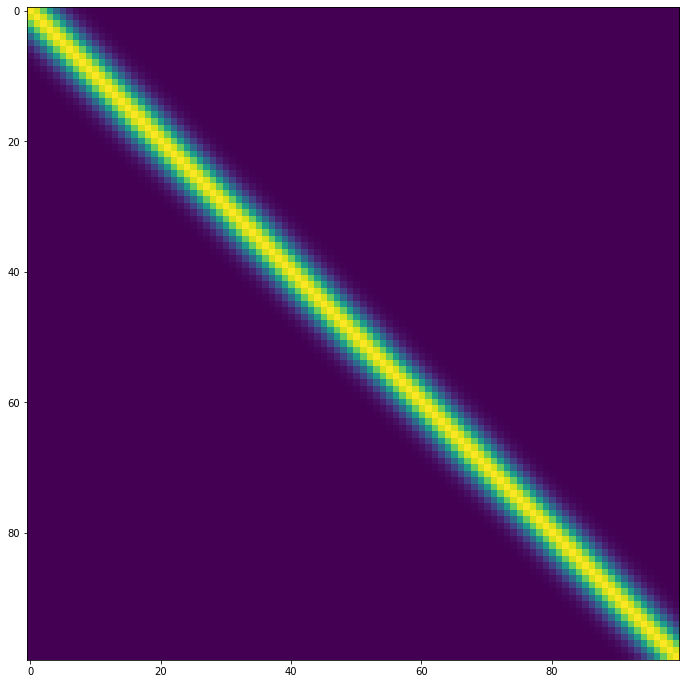

In [21]:
p5_gen_cov_params = (2.5, 280.0)
p5_gen_cov = lambda z, w: generate_cov(z, w, *p5_gen_cov_params)
p5_cov = p5_gen_cov(grid_longT_edges[:-1], grid_longT_edges[:-1])
plt.imshow(p5_cov)

We are now assuming that the provided data are measurements taken every $3$ days. So to demonstrate our prediction, we should choose time stamps that are separated by much less than $3$ days.

We'll choose time stamps that are every $0.5$ days, which is $12$ hours. We'll also remove the time stamps for the original observations from the time stamps for the predictions.

We'll assume the prior means to be the mean of the data over time. This will be provided as a constant value.

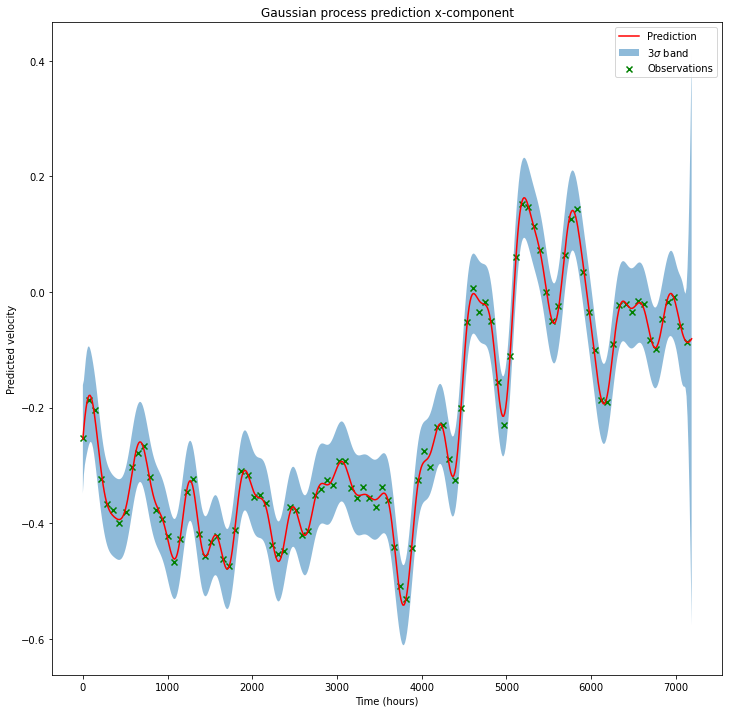

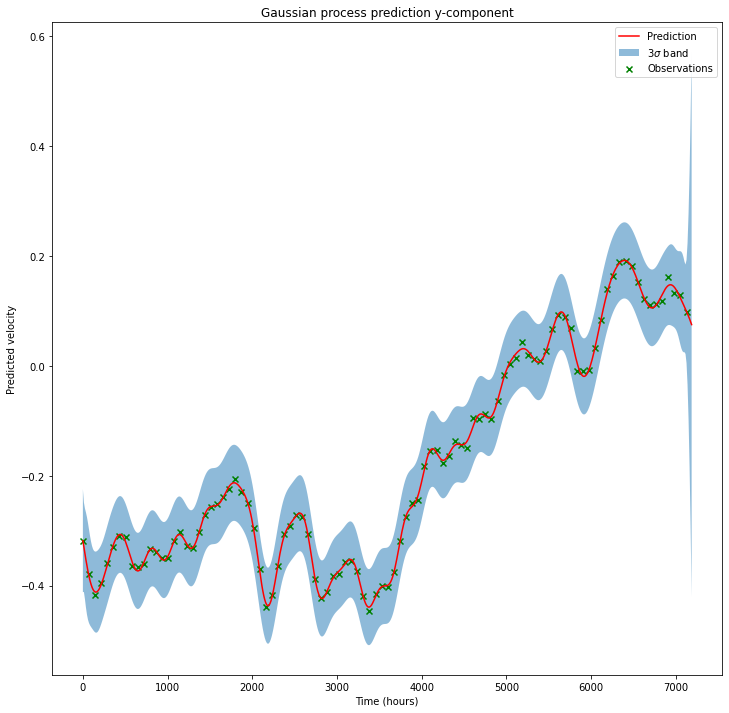

In [22]:
def make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau):
  z = np.array([z])
  cov_blocks = [
               [ gen_cov(z, z), gen_cov(z, obs_zs) ],
               [ gen_cov(z, obs_zs), obs_cov ]
  ]
  pred_mean_cond, pred_var_cond = gaussian_process(np.array([predicted_mean]), obs_means, obs, cov_blocks, tau)
  return pred_mean_cond[0], pred_var_cond[0][0]

def plot_prediction(pred_zs, predicted_mean, gen_cov, obs, obs_means, obs_zs, tau, title):
  obs_cov = gen_cov(obs_zs, obs_zs)
  zs = np.sort(np.concatenate([pred_zs, obs_zs]))
  preds = map(lambda z: make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau), zs)
  pred_means, pred_vars = map(np.array, zip(*preds))

  plt.fill_between(zs, pred_means - 3*np.sqrt(pred_vars), pred_means + 3*np.sqrt(pred_vars), alpha=0.5, label=r"$3\sigma$ band")
  plt.plot(zs, pred_means, c='r', label="Prediction")
  plt.scatter(obs_zs, obs, c='g', marker='x', label="Observations")
  plt.title("Gaussian process prediction {}".format(title))
  plt.xlabel("Time (hours)")
  plt.ylabel("Predicted velocity")
  plt.legend()
  plt.show()

p5_obs_times = np.arange(0, 300, 3)*24.0 # hrs
p5_pred_times = np.array(list(set(np.arange(0, 300, 0.5))-set(p5_obs_times)))*(24.0) # hrs
for p5_obs, title in zip(data[:, 1400//3, 400//3].T, ["x-component", "y-component"]):
  p5_prior_means = p5_obs.mean()*np.ones_like(p5_obs)
  plot_prediction(p5_pred_times, p5_obs.mean(), p5_gen_cov, p5_obs, p5_prior_means, p5_obs_times, 0.001, title)


The following shows the prediction using the `scikit-learn` library, for comment in Problem 4 (d).

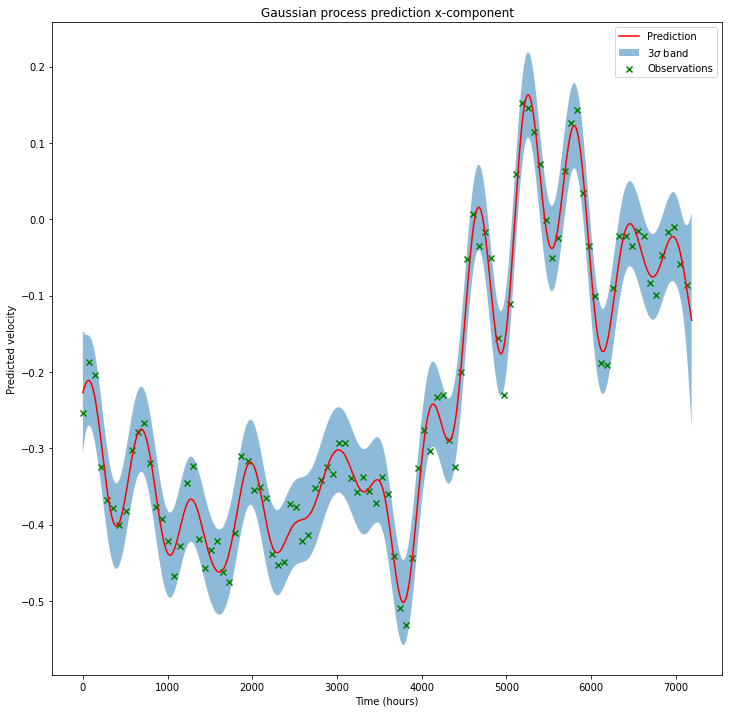

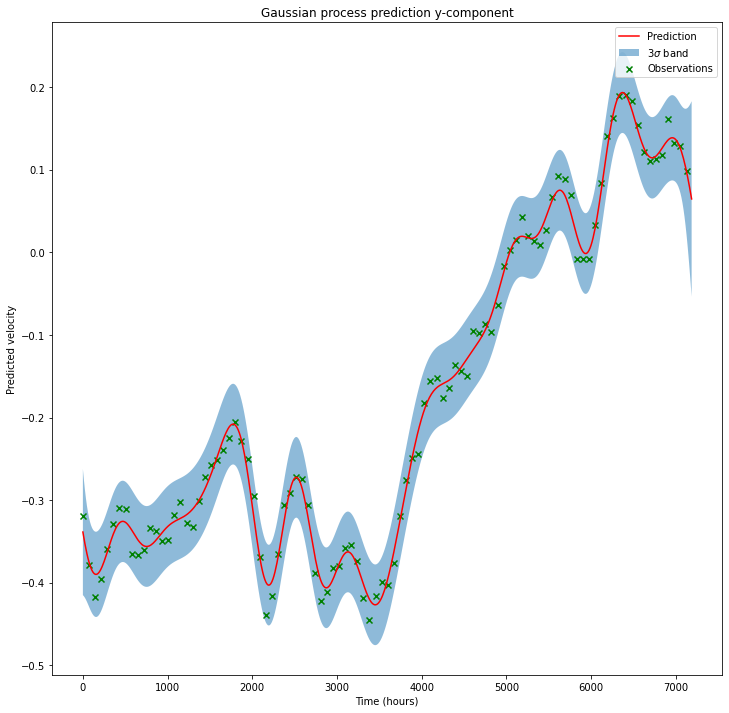

In [23]:
def plot_prediction(pred_zs, obs, obs_zs, tau, title):
  zs = np.sort(np.concatenate([pred_zs, obs_zs]))

  import sklearn.gaussian_process
  GPR = sklearn.gaussian_process.GaussianProcessRegressor(
        kernel = sklearn.gaussian_process.kernels.ConstantKernel(constant_value=p5_gen_cov_params[0], constant_value_bounds=(0.01, 100.0)) * sklearn.gaussian_process.kernels.RBF(length_scale=100.0, length_scale_bounds=(7.5, 375)), 
        alpha = tau, # this is basically tau
        normalize_y = True
        ).fit(obs_zs.reshape(-1, 1), obs)

  #preds = map(lambda z: make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau), zs)
  #pred_means, pred_vars = map(np.array, zip(*preds))
  pred_means, pred_stds = GPR.predict(zs.reshape(-1, 1), return_std=True)
  pred_vars = pred_stds**2

  plt.fill_between(zs, pred_means - 3*np.sqrt(pred_vars), pred_means + 3*np.sqrt(pred_vars), alpha=0.5, label=r"$3\sigma$ band")
  plt.plot(zs, pred_means, c='r', label="Prediction")
  plt.scatter(obs_zs, obs, c='g', marker='x', label="Observations")
  plt.title("Gaussian process prediction {}".format(title))
  plt.xlabel("Time (hours)")
  plt.ylabel("Predicted velocity")
  plt.legend()
  plt.show()

for p5_obs, title in zip(data[:, 1400//3, 400//3].T, ["x-component", "y-component"]):
  plot_prediction(p5_pred_times, p5_obs, p5_obs_times, 0.001, title)

### Problem 6

In [24]:
def jax_generate_cov(zs1, zs2, a, ell):
  return (a**2) * jnp.exp(-(zs1[:,None] - zs2[None, :])**2 / ell**2)

def jax_gaussian_process(x0_mean, x1_mean, x1, cov_blocks, tau):
  cov_11_noise = cov_blocks[1][1] + tau * jnp.eye(x1_mean.shape[0])

  x0_mean_cond1 = x0_mean + cov_blocks[0][1].dot( jax.numpy.linalg.solve(cov_11_noise, x1 - x1_mean ) )
  cov_00_cond2 = cov_blocks[0][0] - cov_blocks[0][1].dot(jax.numpy.linalg.solve(cov_11_noise, cov_blocks[0][1].T))

  return x0_mean_cond1, cov_00_cond2

def jax_make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau):
  z = jnp.array([z])
  cov_blocks = [
               [ gen_cov(z, z), gen_cov(z, obs_zs) ],
               [ gen_cov(z, obs_zs), obs_cov ]
  ]
  pred_mean_cond, pred_var_cond = jax_gaussian_process(jnp.array([predicted_mean]), obs_means, obs, cov_blocks, tau)
  return pred_mean_cond[0], pred_var_cond[0][0]

def jax_v_position(x, grid, g_x_edges, g_y_edges):
    clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))
    vi = clamp(jnp.searchsorted(g_x_edges, x[:,0]), 1, g_x_edges.shape[0]-1)
    vj = clamp(jnp.searchsorted(g_y_edges, x[:,1]), 1, g_y_edges.shape[0]-1)
    return grid[:, vi-1,vj-1,:].T

def get_v_func(gen_cov, t_grid, g_x_edges, g_y_edges, grid_cov, tau):
  
  def v_func(t, x, grid):
    obs = jax_v_position(x, grid, g_x_edges, g_y_edges)

    rfun = jax.vmap(lambda o: jax_make_prediction(t, o.mean(), gen_cov, o, jnp.ones_like(o)*o.mean(), t_grid, grid_cov, tau)[0])
    return rfun(obs.reshape((-1, obs.shape[2]))).reshape((2, obs.shape[1])).T
  return v_func

#@functools.partial(jax.jit, static_argnums=(0,1))
def jax_sim_gp(N, save_stride, t_edges, v_func, v_grid, x_0, epsilon):

  clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))

  def get_grid(t):
    vt = clamp(jnp.searchsorted(t_edges, t), 1, t_edges.shape[0]-1)
    return v_grid[vt-1]

  state_0 = (x_0, 0.0, v_func(0.0, x_0, v_grid), *get_grid(0.0).transpose([2,0,1]))
  
  def step(i, state):
    x, t, v, _, _ = state

    v_t_grid = get_grid(t)
    v = v_func(t, x, v_grid)
    
    x = x + epsilon*v # Compute the next position value
    t = t + epsilon # Compute the next time
    
    new_state = (x, t, v, v_t_grid[:,:,0], v_t_grid[:,:,1])
    return new_state

  def save_step(state, i):
    new_state = jax.lax.fori_loop(i, i+save_stride, step, state)
    return new_state, new_state
  
  _, states = jax.lax.scan(save_step, state_0, xs=jnp.arange(0, N, save_stride))
  return states

@functools.partial(jax.jit, static_argnums=(0,1))
def jax_gp(N, save_stride, t_edges, g_x_edges, g_y_edges, v_grid, x_0, epsilon, a, ell, tau):
  mid = lambda a: (a[1:] + a[:-1])/2
  t_grid, x_grid, y_grid = map(mid, (t_edges, g_x_edges, g_y_edges))
  gen_cov = lambda z, w: jax_generate_cov(z, w, a, ell)
  grid_cov = gen_cov(t_grid, t_grid)
  v_func = get_v_func(gen_cov, t_grid, g_x_edges, g_y_edges, grid_cov, tau)
  return jax_sim_gp(N, save_stride, t_edges, v_func, v_grid, x_0, epsilon)


In [25]:
T = 24*300.0 #@param {type:"number"}
N = 4*T #@param {type:"integer"}
num = 1000 #@param {type:"integer"}
epsilon = T/N # hours

grid_t_edges = np.arange(0, data.shape[0]+1)*3*24 # 3 days per point
grid_x_edges = np.arange(0, data.shape[1]+1)*3 # 3km per point
grid_y_edges = np.arange(0, data.shape[2]+1)*3 # 3km per point

def plot_overlay(ax):
  ax.matshow(mask.T, origin='lower', extent=[0, grid_x_edges.max(), 0, grid_y_edges.max()])
  ax.axis([0, grid_x_edges.max(), 0, grid_y_edges.max()])


### Problem 6 (a)

In [26]:
for x_0_variance in [10**2, 50**2]:
  x_0 = np.random.multivariate_normal(mean=[300, 1050], cov=[[x_0_variance, 0], [0, x_0_variance]], size=num)

  p7_plane_states = jax_gp(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon, *p5_gen_cov_params+(0.001,))
  p7_plane_states_numpy = list(zip(*map(np.array, p7_plane_states)))
  p7_plane_animation = animate(p7_plane_states_numpy, grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
  IPython.display.display(HTML(p7_plane_animation.to_html5_video()))

Looking at the last frame of the simulation with $\sigma=50^2$:

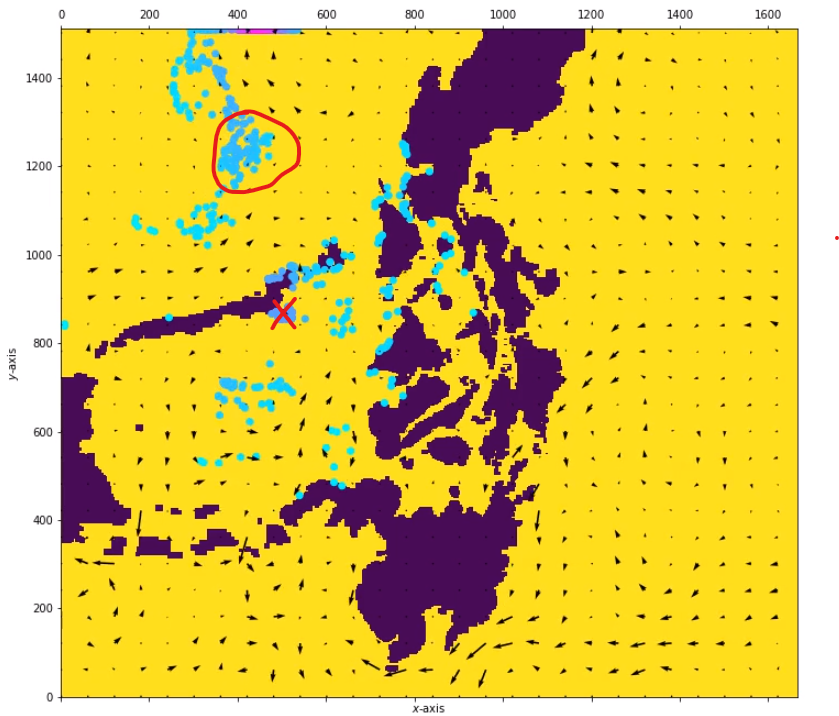

We can see that most of the particles are moving around the area marked by the circle, just a little north of the supposed crash site. This would make a good place to search over sea.

We can also see that a large concentration of particles have collected on the peninsula marked by the cross. Note that the color of the particles is slightly more purple, altered by the KDE, signifying that this collection has more particles than the other coastal locations (apart from the coast directly north of the cross, which might make another good location).

If we examine the final state of the $\sigma^2=10^2$ simulation, we see that many fewer particles get stuck on the coast, but there are still quite a few in the area of the marked circle. If we could only afford to search one location, the marked circle would be a better location than the marked cross.

### Problem 6 (b)

In [27]:
x_0 = np.array([ np.random.rand(num)*grid_x_edges.max(), np.random.rand(num)*grid_y_edges.max() ]).T
x_0 = x_0[np.square(jax_v_position(x_0, data, grid_x_edges, grid_y_edges).T[0]).sum(axis=1) > 0]

midpoint = lambda ar: (ar[1:] + ar[:-1])/2
grid_x, grid_y = np.meshgrid(midpoint(grid_x_edges), midpoint(grid_y_edges), indexing='ij')
p5_states = jax_gp(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon, *p5_gen_cov_params+(0.001,))
p5_states_numpy = list(zip(*map(np.array, p5_states)))
p5_animation = animate(p5_states_numpy, grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
from IPython.display import HTML
HTML(p5_animation.to_html5_video())

Looking at the last frame of the animation:

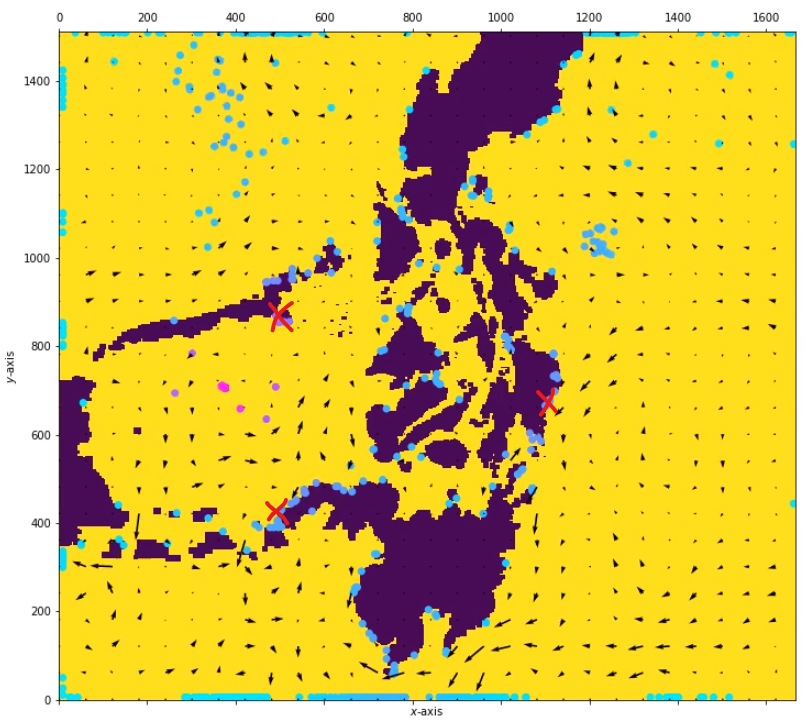

We can see three locations of increased particle density, marked by crosses. The density is denoted by the color, and has been estimated using a KDE.

The northern-most location is on a peninsula, so we might expect it to collect debris. It is also the same location that we found would be a good place to search for the missing plane in the previous part of this problem.

The southern-most location is near a channel between two land-masses. This channel would funnel water through it, possibly collecting a large amount of debris as shown here.

Finally, the eastern-most location simply appears to be a location where the prevailing currents push debris directly on to land. Note that on these eastern coasts, most of the currents travel parallel to the land, and so the debris does not tend to collect except at the marked location.